# Exploratory Spatial Data Analysis: Clustering & Regionalization

- Introduce **clustering**: K-means + Agglomerative Clustering

- Spatial clustering/regionalization

- Example on Cows and Humans

In [155]:
#First load geopandas plus other standard libraries
#####

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd

import seaborn as sns

In [156]:
#Some spurious warning with libpysal
import warnings
warnings.filterwarnings("ignore")

## K-means clustering

*Notion:*

1. Randomly assign all data points to 1 of $k$ clusters
2. Calculate mean of each cluster
3. Reassign each data point to the cluster with the nearest mean (based on Euclidean distance)
4. Re-calculate means, reassign points
5. Repeat until stabilization

Goal is to create clusters where each point is closest to the mean of its cluster.

Note that $k$ is an imposed parameter.

#### Let's first do K-means clustering on synthetic data...We'll generate several binormally distributed point clouds...

In [157]:
#Sample data from the multivariate normal:

from scipy.stats import multivariate_normal


In [158]:
##Function to get points:

#rho = correlation

def get_points(mu_X, mu_Y, sigma_X, sigma_Y, rho, N):

    #Generate the covariance matrix:
    cov = [[sigma_X**2,          rho*sigma_X*sigma_Y,],
           [rho*sigma_X*sigma_Y, sigma_Y**2]]

    means = [mu_X, mu_Y]

    y = multivariate_normal(cov = cov, mean = means, seed = 1)

    X = y.rvs(size = N)

    return X


In [169]:
#Let's get some point clouds:
##################

mu_X_list = [1,2,3,5]
mu_Y_list = [1,8,5,7]

#sigma_X_list = [1,1,1,1]
#sigma_Y_list = [1,1,1,2]

#Change to different scale with these lists:
sigma_X_list = [1,1,1,1]
sigma_Y_list = [10,10,10,20]

#Different correlations
rho_list = [.1, 0, .5, -.6]

N = 200
X = np.zeros([N,3])

#Build up our point matrices:
#Format is:
#x, y, cloud_number
for k in range(4):
    X_new = np.zeros([N,3])
    X_new[:,:2] = get_points(mu_X = mu_X_list[k], mu_Y = mu_Y_list[k],
                   sigma_X = sigma_X_list[k], sigma_Y = sigma_Y_list[k], rho=rho_list[k], N = N)
    
    X_new[:,2] = k
    
    if (k == 0):
        X = X_new
    else:
        X = np.concatenate((X, X_new), axis=0)

        
#What did we get?
X

array([[  0.5554303 ,  17.24959257,   0.        ],
       [ -0.12082716,  -4.27093331,   0.        ],
       [ -1.20236372,   9.67719855,   0.        ],
       ...,
       [  6.24916249, -13.41862216,   3.        ],
       [  6.86152352, -30.44108235,   3.        ],
       [  6.70821685,   6.34333191,   3.        ]])

<AxesSubplot: >

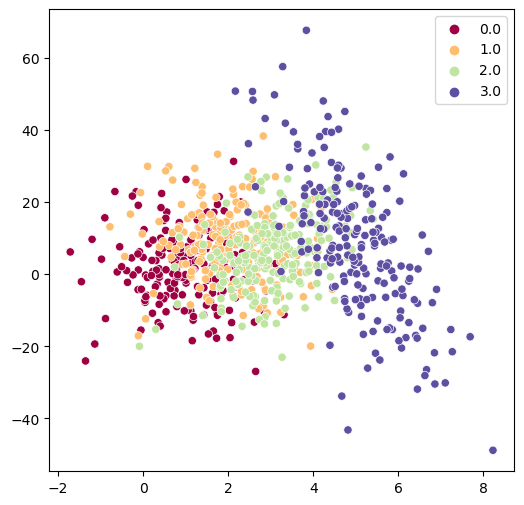

In [170]:
#And plot to see what we got:
fig, ax1 = plt.subplots(1,1, figsize=(6, 6))

sns.scatterplot(x=X[:,0], y=X[:,1], hue=X[:,2], data=None, ax=ax1, palette="Spectral")

#ax1.scatter(X[:,0], X[:,1], c=X[:,2], cmap='viridis')

In [171]:
#Now for the K-Means
#######

from sklearn.cluster import KMeans

In [172]:
#Embed our data in a Pandas DataFrame:
#Save the origin, i.e. which distribution did the point come from?
df = pd.DataFrame({'x':X[:,0], 'y':X[:,1], 'origin':X[:,2]})
df

,x,y,origin
0,0.555430,17.249593,0.0
1,-0.120827,-4.270933,0.0
2,-1.202364,9.677199,0.0
3,0.418911,18.455758,0.0
4,0.784128,4.192895,0.0
...,...,...,...
795,7.270396,-21.488627,3.0
796,5.667424,-2.495980,3.0
797,6.249162,-13.418622,3.0
798,6.861524,-30.441082,3.0


In [173]:
#Create a K-Means model with 4 clusters
#Try changing this...
kmeans = KMeans(n_clusters=4)


In [174]:
#Just grab x and y for fitting
df_reduced = df[['x', 'y']]


In [175]:
#And fit the model:
km = kmeans.fit(df_reduced)

In [176]:
km

KMeans(n_clusters=4)

In [177]:
#Recover the labels:
df["label"] = km.labels_
df["label"]

0      3
1      0
2      3
3      3
4      0
      ..
795    2
796    0
797    2
798    2
799    0
Name: label, Length: 800, dtype: int32

<AxesSubplot: xlabel='x', ylabel='y'>

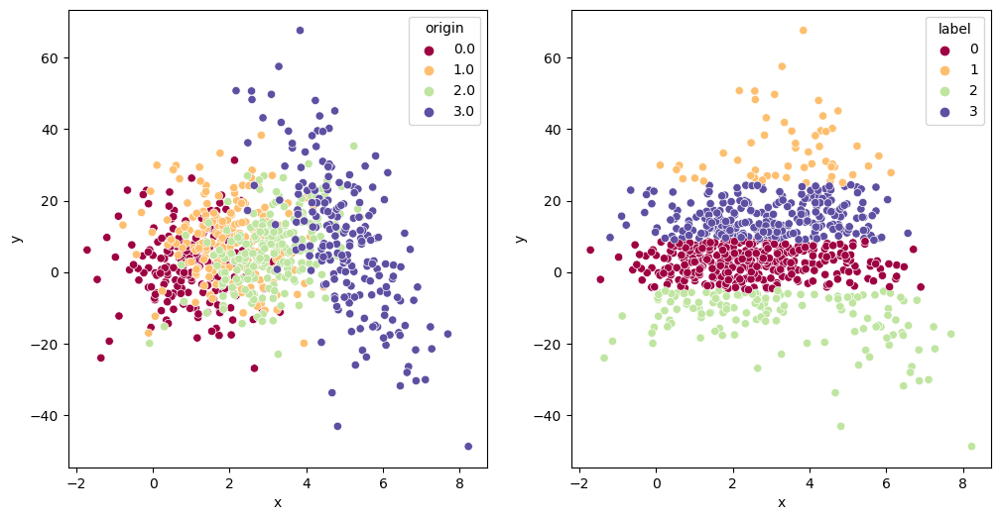

In [178]:
#Let's check out the results:
#####

fig, ax1 = plt.subplots(1,2, figsize=(12, 6))

sns.scatterplot(x='x', y='y', data=df, ax=ax1[0], hue='origin', palette="Spectral")
sns.scatterplot(x='x', y='y', data=df, ax=ax1[1], hue='label', palette="Spectral")


#### Re-run the above with data that varies in scale along the dimensions...

Then rescale:

In [179]:
#Let's re-scale our data:
#The easy way:
from sklearn.preprocessing import scale

df_scaled = scale(df[['x', 'y']])

<AxesSubplot: xlabel='x', ylabel='y'>

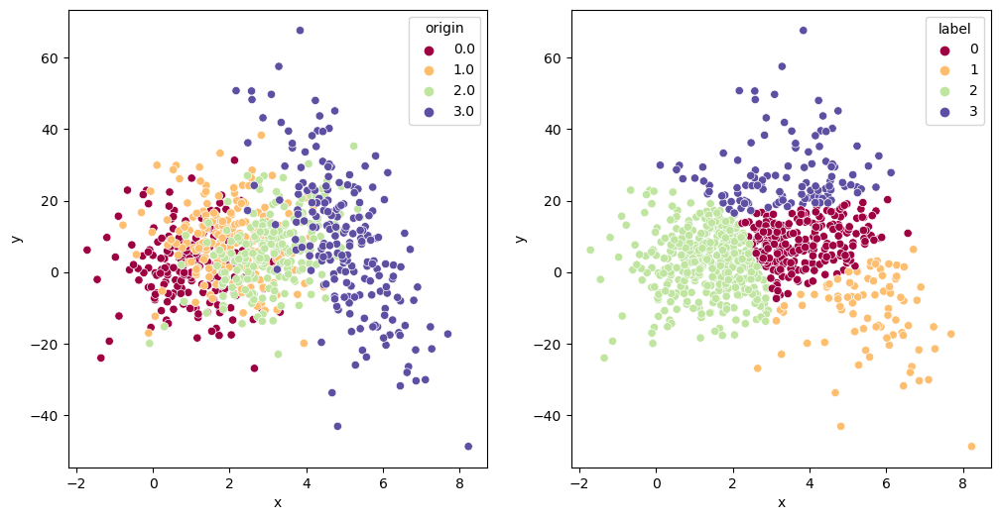

In [180]:
#Again fit, recover labels, and plot:
kmeans = KMeans(n_clusters=4)

km = kmeans.fit(df_scaled)

#Recover the labels:
df["label"] = km.labels_

#Plot
#####

fig, ax1 = plt.subplots(1,2, figsize=(12, 6))

sns.scatterplot(x='x', y='y', data=df, ax=ax1[0], hue='origin', palette="Spectral")
sns.scatterplot(x='x', y='y', data=df, ax=ax1[1], hue='label', palette="Spectral")


### Now Apply to Geographic Data

Let's see how human and cow populations cluster...

#### 1. Get our county geometries + demographics

We've done this so many times already...Let's do it again


#### 2. Let's load in our previous results on cows

Load and merge...

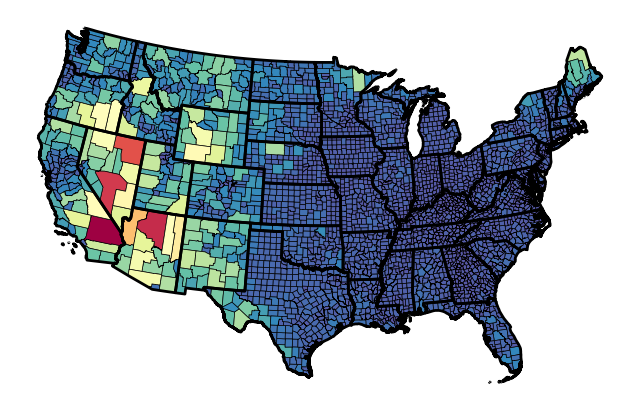

In [181]:
#Once again get County and State Geometries
################

#Load the counties and states:
#URLs:
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'
url_state = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'

#Load:
county_gdf = gpd.read_file(url_county)
state_gdf = gpd.read_file(url_state)

## Convert CRS to North American Albers, EPSG 5070
county_gdf = county_gdf.to_crs(5070)
state_gdf = state_gdf.to_crs(5070)

#Restrict to contiguous US
exclude_list = [15, 72, 2, 60, 66, 69, 78]

#~ is not
state_gdf = state_gdf.loc[~state_gdf['STATEFP'].astype(int).isin(exclude_list)]
county_gdf = county_gdf.loc[~county_gdf['STATEFP'].astype(int).isin(exclude_list)]


#Add a FIPS code for the counties
county_gdf['FIPS'] = county_gdf.STATEFP + county_gdf.COUNTYFP


#Quick Check:
##########
fig, ax1 = plt.subplots(1,1, figsize=(8, 6))

#Draw the counties:
county_gdf.plot(ax = ax1, linewidth = .5, edgecolor = 'black', column = 'ALAND', cmap='Spectral_r')

#And the states as outline
state_gdf.plot(ax = ax1, linewidth = 2, edgecolor = 'black', facecolor = 'none')

ax1.set_axis_off()

In [182]:
### And Get Census Data Once Again
####################

#Here's our URL:
url_name = r'https://www2.census.gov/programs-surveys/popest/datasets/2010-2020/counties/totals/co-est2020-alldata.csv'

#Load
df = pd.read_csv(url_name, encoding = "ISO-8859-1", engine='python')

#Create the FIPS:
df['FIPS'] = df.STATE.astype(str).str.zfill(2) + df.COUNTY.astype(str).str.zfill(3)

#Merge to create gdf_county_all
gdf_county_all = county_gdf.merge(df, left_on='FIPS', right_on='FIPS', how='left')


In [183]:
#Add in population density too:
####

gdf_county_all['POPDENSITY2020'] = gdf_county_all.POPESTIMATE2020 / gdf_county_all.ALAND * 1e6

#### And our county-level cow results:

In [184]:
#County-level cow data:
#Note we get FIPS as a string
df_cattle = pd.read_csv('../Module_2/Data/2020_cattle_counties_processed.csv', dtype={'FIPS': str})

df_cattle


,FIPS,COWS,COWS_PER_PERSON,COW_DENSITY,POPESTIMATE2020
0,20161,29500.0,0.402994,18.681792,73202
1,19159,50000.0,10.414497,36.050785,4801
2,30009,78000.0,7.142203,14.706635,10921
3,16007,28500.0,4.639427,11.277646,6143
4,55011,63000.0,4.833883,35.994018,13033
...,...,...,...,...,...
3103,53003,10300.0,0.451358,6.252170,22820
3104,13043,3500.0,0.318616,5.559784,10985
3105,48451,41000.0,0.341638,10.400903,120010
3106,39089,22500.0,0.126334,12.729997,178100


### Merge the results, proceed with the clustering!

In [185]:
#Make a dataframe with just the variables of interest:
gdf = gdf_county_all[['STATEFP', 'FIPS', 'POPESTIMATE2020', 'POPDENSITY2020', 'geometry']].\
        merge(df_cattle[['FIPS', 'COW_DENSITY', 'COWS']], on='FIPS', how='left')

In [186]:
#Just drop any NaNs
gdf = gdf.dropna()

In [187]:
#And let's convert everything to a logarithmic scale:
##########

gdf['POPESTIMATE2020'] = np.log(gdf['POPESTIMATE2020'])
gdf['COWS'] = np.log(gdf['COWS'])

gdf['POPDENSITY2020'] = np.log(gdf['POPDENSITY2020'])
gdf['COW_DENSITY'] = np.log(gdf['COW_DENSITY'])


<AxesSubplot: xlabel='POPDENSITY2020', ylabel='COW_DENSITY'>

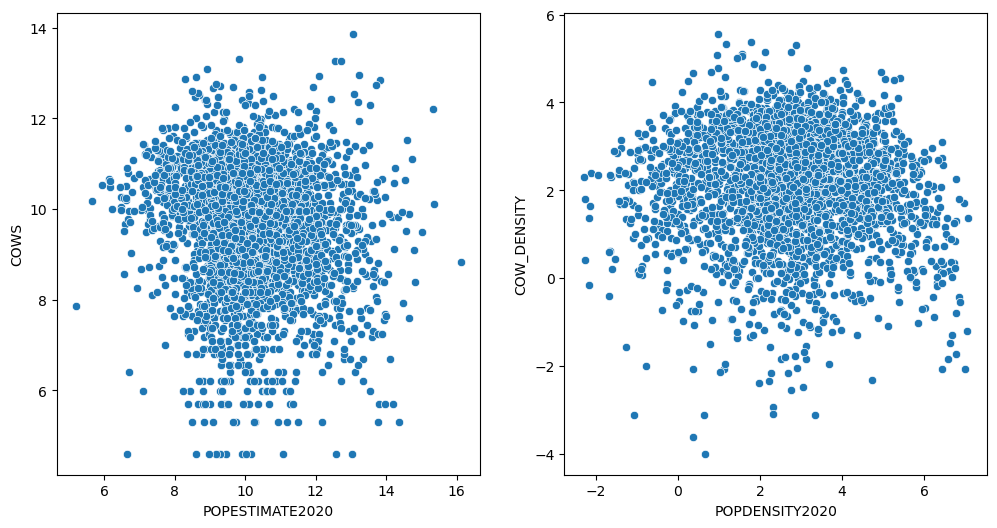

In [188]:
#Some quick plots of our distributions:

fig, ax1 = plt.subplots(1,2, figsize=(12, 6))

#Aboslute:
sns.scatterplot(x='POPESTIMATE2020', y='COWS', data=gdf, ax=ax1[0], palette="Spectral")

#Density:
sns.scatterplot(x='POPDENSITY2020', y='COW_DENSITY', data=gdf, ax=ax1[1], palette="Spectral")

In [189]:
#Let's re-scale our data:
########

from sklearn.preprocessing import scale



In [190]:
#Do either absolute population or density:

if (0):
    #Absolute:
    gdf_scaled = scale(gdf[['POPESTIMATE2020', 'COWS']])
    pop_var = 'POPESTIMATE2020'
    cow_var = 'COWS'
else:
    #Density:
    gdf_scaled = scale(gdf[['POPDENSITY2020', 'COW_DENSITY']])
    pop_var = 'POPDENSITY2020'
    cow_var = 'COW_DENSITY'

<AxesSubplot: >

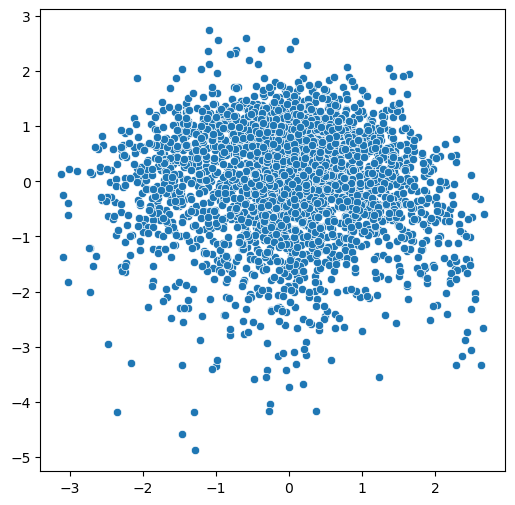

In [191]:
#Quick check:
fig, ax1 = plt.subplots(1,1, figsize=(6, 6))

sns.scatterplot(x=gdf_scaled[:,0], y=gdf_scaled[:,1], ax=ax1, palette="Spectral")

<AxesSubplot: xlabel='POPDENSITY2020', ylabel='COW_DENSITY'>

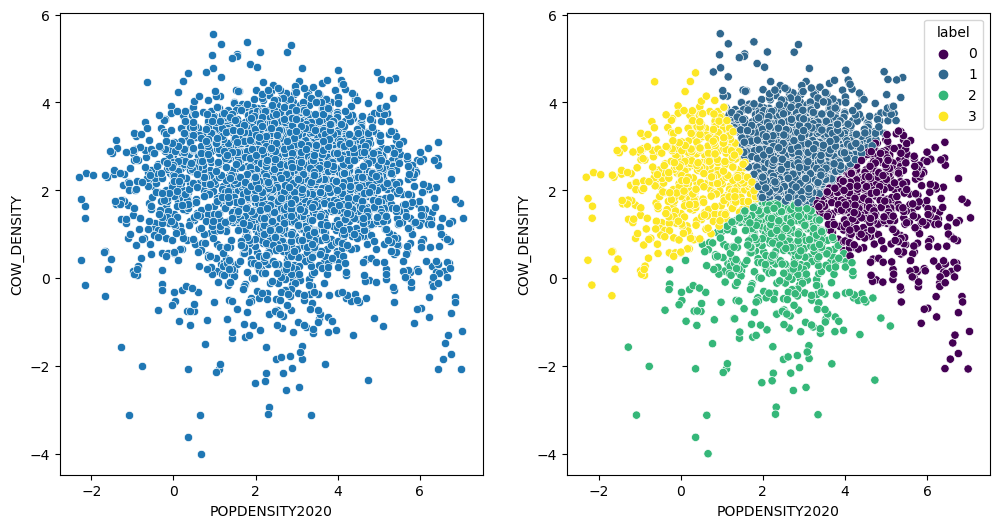

In [192]:
#Again fit, recover labels, and plot:
kmeans = KMeans(n_clusters=4)

km = kmeans.fit(gdf_scaled)

#Recover the labels:
gdf["label"] = km.labels_

#Plot
#####

fig, ax1 = plt.subplots(1,2, figsize=(12, 6))

sns.scatterplot(x=pop_var, y=cow_var, data=gdf, ax=ax1[0], palette="Spectral")
sns.scatterplot(x=pop_var, y=cow_var, data=gdf, ax=ax1[1], hue='label', palette="viridis")


#### What did we get spatially?

In [193]:
#Just put in a function:
###
def plot_cow_clusters(gdf, just_clusters = 0, figsize=(12,8)):
    #Plot only the cluster membership:
    if (just_clusters):
        fig, ax1 = plt.subplots(1,1, figsize=figsize, dpi=300)

        gdf.plot(ax=ax1, column = 'label', linewidth=.1, edgecolor = 'black', cmap='Spectral', categorical=True, legend=True)
        ax1.set_title('Clusters', y=.95)
        
        ax1.set_axis_off()
        
    #Plot the population variable, cow variable, and the clusters:
    else:
        fig, ax1 = plt.subplots(2,2, figsize=(16, 9), dpi=300)

        ax1 = ax1.flatten()

        my_cmap = 'Reds'

        gdf.plot(ax=ax1[0], column = pop_var, scheme='quantiles', linewidth=.1, edgecolor = 'black', cmap=my_cmap)
        ax1[0].set_title('Humans', y=.95)

        gdf.plot(ax=ax1[1], column = cow_var,  scheme='quantiles', linewidth=.1, edgecolor = 'black', cmap=my_cmap)
        ax1[1].set_title('Cows', y=.95)

        gdf.plot(ax=ax1[2], column = 'label', linewidth=.1, edgecolor = 'black', cmap='Spectral', categorical=True, legend=True)
        ax1[2].set_title('Clusters', y=.95)

        for k in range(4):
            ax1[k].set_axis_off()
        plt.subplots_adjust(wspace=-.25, hspace=0)

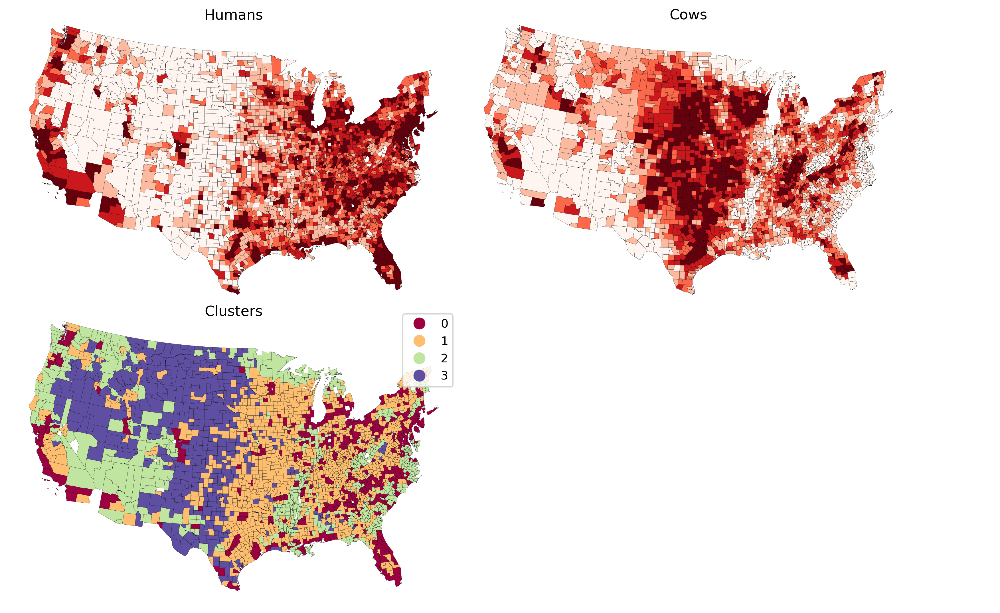

In [194]:
##Plot all:

plot_cow_clusters(gdf, just_clusters=0)

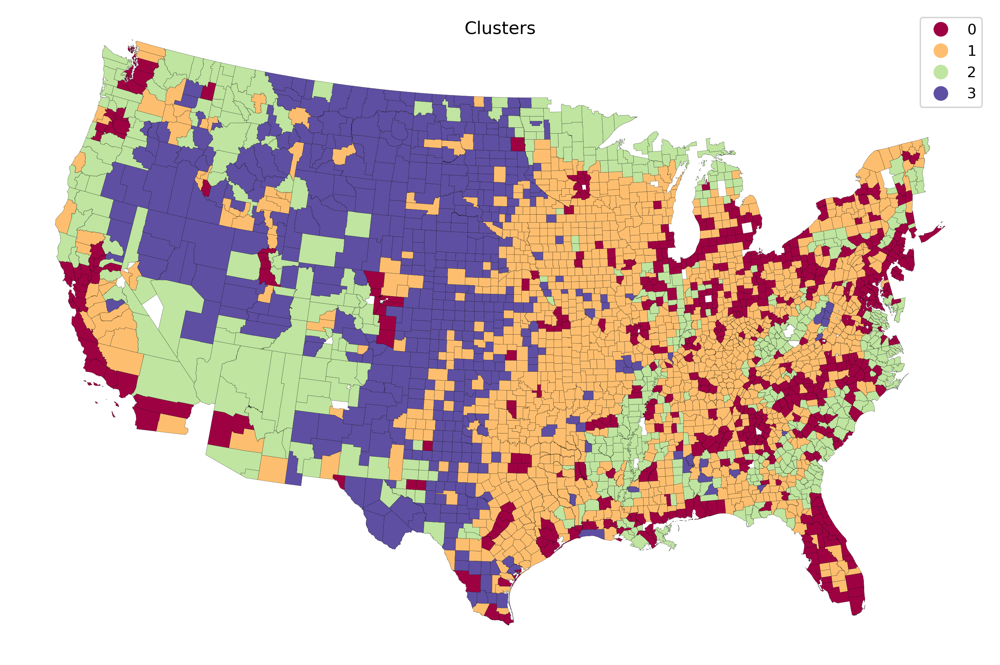

In [195]:
##Plot just the clusters:

plot_cow_clusters(gdf, just_clusters=1)

### Can also do hierarchical agglomerative clustering

See the docs:

- https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html
- https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_clustering.html#sphx-glr-auto-examples-cluster-plot-agglomerative-clustering-py

In [196]:
from sklearn.cluster import AgglomerativeClustering


<AxesSubplot: xlabel='POPDENSITY2020', ylabel='COW_DENSITY'>

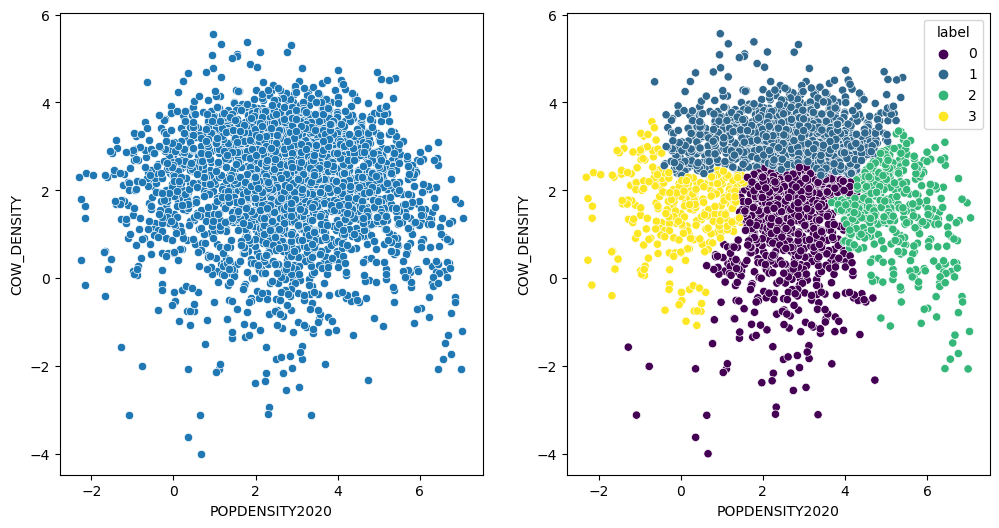

In [198]:
#Create an agglomerative model:
model = AgglomerativeClustering(linkage="ward", n_clusters=4)

ac = model.fit(gdf_scaled)

#Recover the labels:
gdf["label"] = ac.labels_

#Plot
#####

fig, ax1 = plt.subplots(1,2, figsize=(12, 6))

sns.scatterplot(x=pop_var, y=cow_var, data=gdf, ax=ax1[0], palette="Spectral")
sns.scatterplot(x=pop_var, y=cow_var, data=gdf, ax=ax1[1], hue='label', palette="viridis")


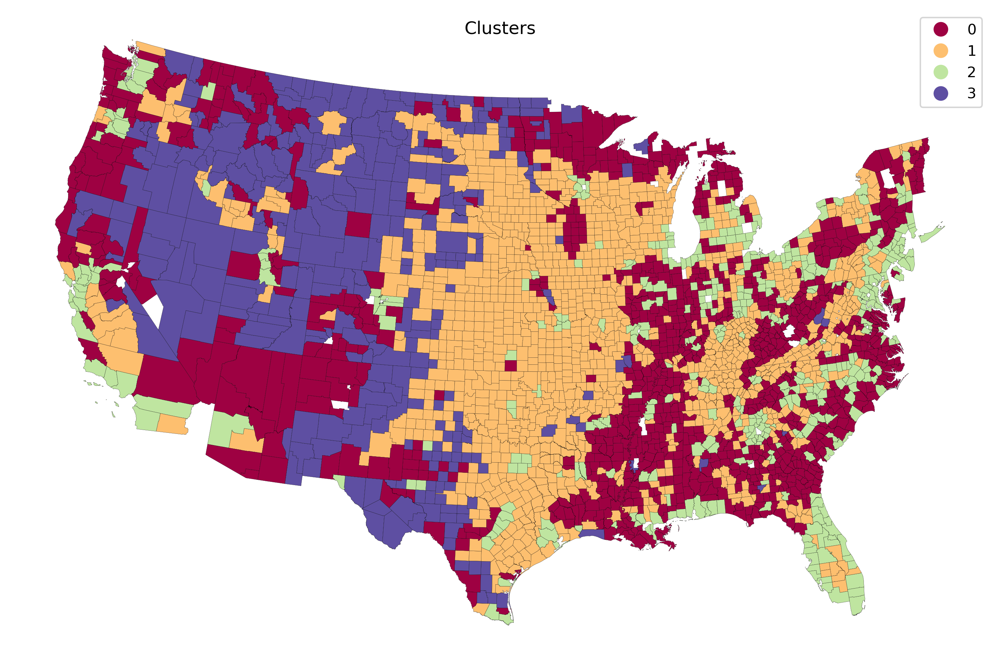

In [199]:
#And geometry of clusters
plot_cow_clusters(gdf, just_clusters=1)

In [200]:
#Mean cluster characteristics?
#####

gdf.groupby(by='label').mean()

,POPESTIMATE2020,POPDENSITY2020,COW_DENSITY,COWS
label,,,,
0,10.103877,2.712112,1.233765,8.625530
1,10.001891,2.588921,3.221798,10.634768
2,12.365426,5.145837,1.515044,8.734633
3,8.467517,0.005250,1.597241,10.059508


### Now impose connectivity structure on the cluster algorithm

- Now, let's require that clusters be connected in space
- Use adjacency matrix methods we developed in context of autocorrelation

In [201]:
#Needed for adjacency matrices

from libpysal import weights

In [217]:
#County adjacency matrix:
#Can try various
w_queen = weights.contiguity.Queen.from_dataframe(gdf)
w_counties = w_queen

#w_knn = weights.distance.KNN.from_dataframe(gdf, k=6)
#w_counties = w_knn

<AxesSubplot: xlabel='POPDENSITY2020', ylabel='COW_DENSITY'>

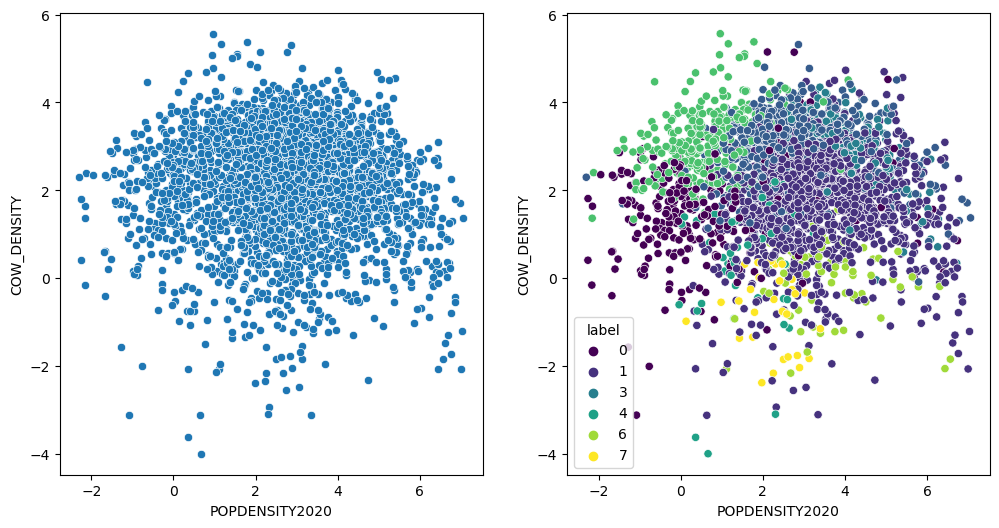

In [218]:
#Create model with connectivity:
###
model = AgglomerativeClustering(linkage="ward", n_clusters=8, connectivity=w_counties.sparse)


#Fit:
ac = model.fit(gdf_scaled)


#Recover the labels:
gdf["label"] = ac.labels_

#Plot
#####

fig, ax1 = plt.subplots(1,2, figsize=(12, 6))

#Just the data:
sns.scatterplot(x=pop_var, y=cow_var, data=gdf, ax=ax1[0], palette="Spectral")

#And cluster membership:
sns.scatterplot(x=pop_var, y=cow_var, data=gdf, ax=ax1[1], hue='label', palette="viridis")

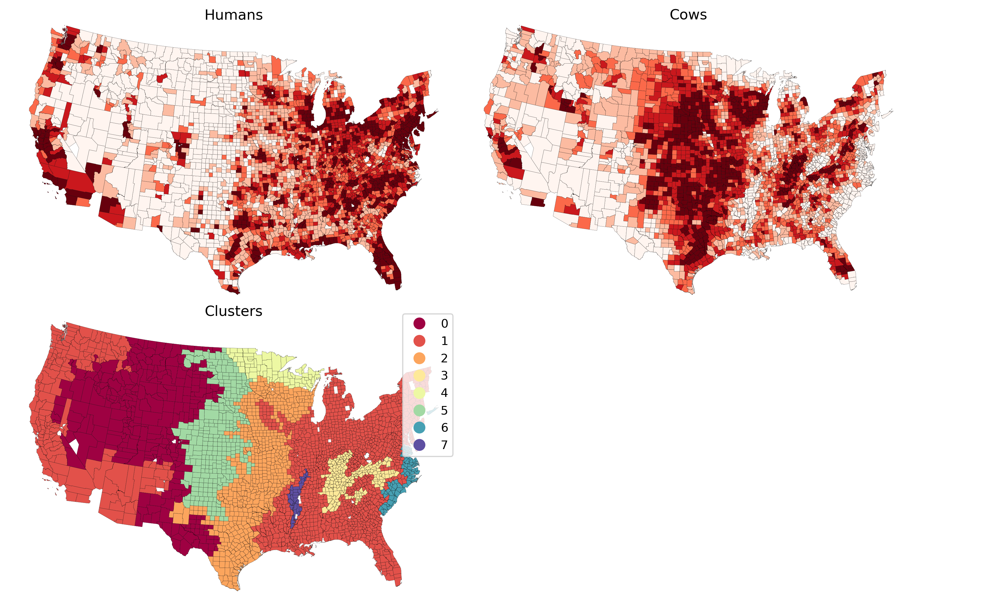

In [223]:
plot_cow_clusters(gdf, just_clusters=0)

In [220]:
#Mean cluster characteristics?
#####

gdf.groupby(by='label').mean()

,POPESTIMATE2020,POPDENSITY2020,COW_DENSITY,COWS
label,,,,
0,9.229686,0.657071,1.500670,10.073285
1,10.689654,3.381195,1.770776,9.079236
2,10.237187,2.768390,3.097185,10.565982
3,10.850493,3.946982,2.986623,9.890134
4,9.720163,1.744616,0.821707,8.797253
5,8.498386,0.687385,3.137631,10.948632
6,10.577539,3.587790,0.001025,6.990774
7,9.479576,2.215879,-0.715101,6.548597


<AxesSubplot: xlabel='POPDENSITY2020', ylabel='COW_DENSITY'>

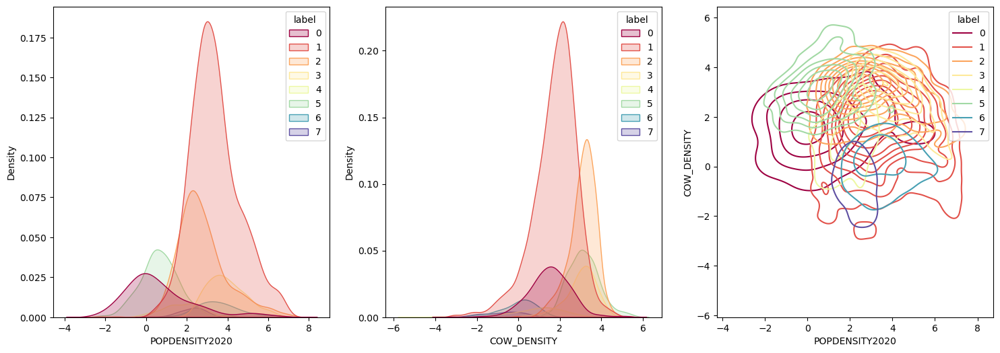

In [221]:
#Can visualize clusters:
##
my_cmap='Spectral'

fig, ax1 = plt.subplots(1,3, figsize=(18, 6))

#Univariate densities:
sns.kdeplot(x='POPDENSITY2020', data=gdf, ax=ax1[0], hue='label', palette=my_cmap, fill=True)
sns.kdeplot(x='COW_DENSITY', data=gdf, ax=ax1[1], hue='label', palette=my_cmap, fill=True)


sns.kdeplot(x='POPDENSITY2020', y='COW_DENSITY', data=gdf, ax=ax1[2], hue='label', palette=my_cmap)


<AxesSubplot: xlabel='POPESTIMATE2020', ylabel='COWS'>

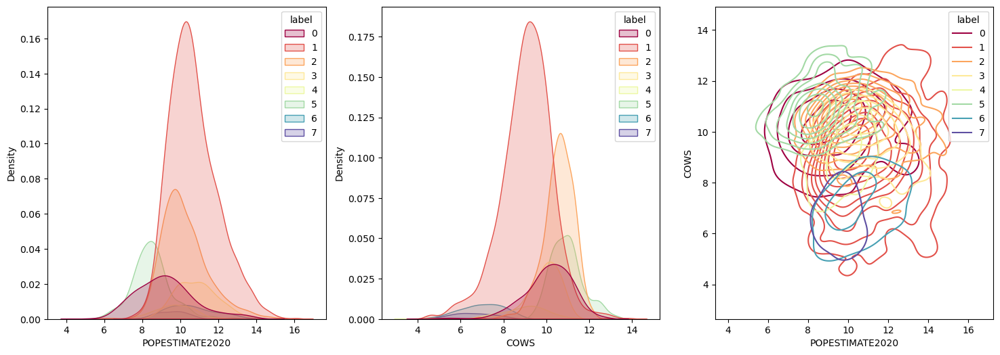

In [222]:
fig, ax1 = plt.subplots(1,3, figsize=(18, 6))

sns.kdeplot(x='POPESTIMATE2020', data=gdf, ax=ax1[0], hue='label', palette=my_cmap, fill=True)
sns.kdeplot(x='COWS', data=gdf, ax=ax1[1], hue='label', palette=my_cmap, fill=True)

sns.kdeplot(x='POPESTIMATE2020', y='COWS', data=gdf, ax=ax1[2], hue='label', palette=my_cmap)
